In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action='ignore')

sns.set_theme(style="whitegrid", palette="Set2")

# 한글 설정
plt.rc("font", family="AppleGothic")
plt.rcParams['axes.unicode_minus'] = False   

## TrainSet Load

In [2]:
train_label = pd.read_csv("data/processed/train_label.csv")
test_label = pd.read_csv("data/processed/test_label.csv")

activity = pd.read_csv("./data/processed/activity.csv", parse_dates=['activity_date'])
met_class = pd.read_csv("./data/processed/log/met_class.csv", parse_dates=['activity_date'])
met_log = pd.read_csv("./data/processed/log/met_log.csv", parse_dates=['activity_date'])

sleep = pd.read_csv("./data/processed/sleep.csv", parse_dates=['sleep_bedtime_start','sleep_bedtime_end'])
sleep_log = pd.read_csv("./data/processed/log/sleep_log.csv", parse_dates=['sleep_bedtime_start'])

In [3]:
# Train 라벨 데이터 병합
train_activity = activity.merge(train_label, how="inner", on="EMAIL")
train_metclass = met_class.merge(train_label, how="inner", on="EMAIL")
train_metlog = met_log.merge(train_label, how="inner", on="EMAIL")

In [4]:
print("Train Activity: ", train_activity.shape)
print("Train MET Class: ", train_metclass.shape)
print("Train MET Log: ", train_metlog.shape)

Train Activity:  (9705, 27)
Train MET Class:  (2780866, 5)
Train MET Log:  (13975200, 5)


## Activity 이상치 결측치 제거

In [8]:
fig, axes = plt.subplots(24, 24, figsize=(80, 80))
features = train_activity.columns[2:-1] # label만 제외 
for i, f1 in enumerate(features):
    for j, f2 in enumerate(features):
        if i <= j :
            axes[i][j].set_visible(False) # 중복 제거
            continue
        for diag_nm in train_activity['DIAG_NM'].unique():
            iris_sub = train_activity[train_activity['DIAG_NM']==diag_nm]
            axes[i][j].scatter(x=iris_sub[f2],
                               y=iris_sub[f1],
                               label=diag_nm,
                               alpha=0.7)
        axes[i][j].set_xlabel(f2)
        axes[i][j].set_ylabel(f1)

plt.tight_layout()
plt.show()

In [9]:
# 이상치 조건 정의
def is_outlier(row):
    if (
        10000 <= row['activity_steps'] <= 20000 and
        row['activity_total'] <= 2000 and
        row['activity_cal_active'] <= 100 and
        row['activity_daily_movement'] <= 1000
    ):
        return True
    return False

# 이상치 대체값 계산 
def replace_outlier(row, col, med):
    return med[col] if row['is_outlier'] else row[col]

# 중앙값 사이 값 계산
def calculate_average_median(train_sleep, col):
    median = train_sleep[~train_sleep['is_outlier']][col].median()
    return median


In [10]:
# 낮은 steps 그룹과 값 비교
outlier_idx = list(train_activity[train_activity.apply(is_outlier, axis=1)].index)
low_steps = train_activity[(450<train_activity['activity_steps']) & (train_activity['activity_steps']<=700)]
low_steps_idx = list(low_steps.index)
# 비슷한 그룹의 평균값으로 대체
replace_values = int(low_steps.activity_steps.mean()) # 563
train_activity.loc[outlier_idx, 'activity_steps'] = replace_values

,5382,9336,9452,120,2032,3038,3232,3735,5305,5335,...,6540,6553,6556,6565,6568,6915,7147,7372,8443,8454
EMAIL,nia+291@rowan.kr,nia+411@rowan.kr,nia+240@rowan.kr,nia+354@rowan.kr,nia+349@rowan.kr,nia+398@rowan.kr,nia+079@rowan.kr,nia+334@rowan.kr,nia+353@rowan.kr,nia+353@rowan.kr,...,nia+139@rowan.kr,nia+139@rowan.kr,nia+139@rowan.kr,nia+139@rowan.kr,nia+139@rowan.kr,nia+176@rowan.kr,nia+044@rowan.kr,nia+229@rowan.kr,nia+196@rowan.kr,nia+196@rowan.kr
activity_date,2020-10-26 00:00:00,2020-12-05 00:00:00,2020-12-20 00:00:00,2020-12-31 00:00:00,2021-01-08 00:00:00,2021-01-05 00:00:00,2021-01-06 00:00:00,2020-12-23 00:00:00,2020-11-26 00:00:00,2020-12-29 00:00:00,...,2020-11-01 00:00:00,2020-11-20 00:00:00,2020-11-24 00:00:00,2020-12-06 00:00:00,2020-12-11 00:00:00,2020-11-16 00:00:00,2021-01-04 00:00:00,2020-12-30 00:00:00,2020-12-20 00:00:00,2020-12-31 00:00:00
activity_non_wear,0,0,0,0,44,295,0,59,258,299,...,195,0,0,61,0,133,0,252,43,0
activity_total,11,0,33,14,27,27,22,31,33,23,...,21,32,36,28,34,38,33,31,35,32
activity_cal_active,7,0,27,19,20,26,39,27,23,18,...,17,24,30,21,25,28,28,21,27,24
activity_cal_total,1788,1793,1859,1786,1831,1842,1829,1821,1984,1934,...,1950,1978,1965,2023,1953,1956,1802,1871,1870,1876
activity_daily_movement,92,0,484,385,221,511,614,472,189,242,...,132,105,265,109,156,339,489,211,391,395
activity_steps,19917,10853,13847,473,513,585,552,669,543,457,...,452,527,597,553,515,685,598,589,599,639
activity_inactivity_alerts,0,0,1,0,0,0,0,0,0,1,...,1,2,0,1,1,1,0,0,0,0
activity_rest,1362,1430,1164,194,200,216,127,214,539,647,...,652,744,764,541,1029,663,104,745,1178,1175


In [11]:
replace_values = int(low_steps.activity_steps.mean()) # 563
train_activity.loc[outlier_idx, 'activity_steps'] = replace_values

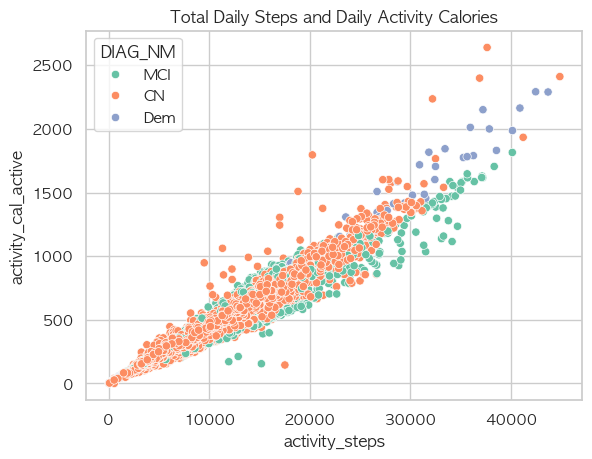

In [13]:
sns.scatterplot(data=train_activity, x='activity_steps', y='activity_cal_active', hue='DIAG_NM')
plt.title("Total Daily Steps and Daily Activity Calories")
plt.show()

### activity_average_met < 1

- 15개. 위의 is_outlier 3개와 겹침. -> 이상치로 판단 drop

In [14]:
idx = train_activity[train_activity['activity_average_met']<1].index
print("drop DIAG_NM 별 갯수: ", train_activity[train_activity['activity_average_met']<1].groupby('DIAG_NM')['DIAG_NM'].value_counts())
print("activity_average_met < 1 갯수: ", len(idx))

drop DIAG_NM 별 갯수:  DIAG_NM
CN     4
Dem    2
MCI    9
Name: count, dtype: int64
activity_average_met < 1 갯수:  15


In [15]:
train_activity = train_activity.drop(idx, axis=0)

In [37]:
train_activity.reset_index(drop=True, inplace=True)

### score == 0

- `score` 값이 1~100 사이로 존재해야 하지만, 데이터가 없는 경우 0으로 기록됨
즉, "0"은 실제 점수가 아니라 "결측값(missing value)" 을 의미할 가능성이 큼

In [38]:
score_is_zero = (train_activity['activity_score']==0)|(train_activity['activity_score_meet_daily_targets']==0)|(train_activity['activity_score_move_every_hour']==0)|\
                (train_activity['activity_score_recovery_time']==0)|(train_activity['activity_score_stay_active']==0)|\
                (train_activity['activity_score_training_frequency']==0)|(train_activity['activity_score_training_volume']==0)

In [39]:
# score 관련 컬럼 목록
score_cols = [
    "activity_score", "activity_score_meet_daily_targets", "activity_score_move_every_hour",
    "activity_score_recovery_time", "activity_score_stay_active", "activity_score_training_frequency",
    "activity_score_training_volume"
]

# 0을 NaN으로 변환
train_activity[score_cols] = train_activity[score_cols].replace(0, np.nan)

# 사용자 단위 선형 보간
score_interpolated = train_activity.groupby("EMAIL")[score_cols].apply(lambda x: x.interpolate()).reset_index(names=['EMAIL','index'])
train_activity.loc[score_interpolated['index'], score_cols] = score_interpolated[score_cols]

In [40]:
train_activity.loc[score_is_zero]

,EMAIL,activity_date,activity_non_wear,activity_total,activity_cal_active,activity_cal_total,activity_daily_movement,activity_steps,activity_inactivity_alerts,activity_rest,...,activity_met_min_high,activity_average_met,activity_score,activity_score_meet_daily_targets,activity_score_move_every_hour,activity_score_recovery_time,activity_score_stay_active,activity_score_training_frequency,activity_score_training_volume,DIAG_NM


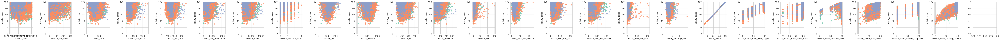

In [22]:
fig, axes = plt.subplots(1,26, figsize=(80,3.5))

features=train_activity.columns[1:-1] # EMAIL, DIAG_NM 제외 

for i, f1 in enumerate(features):
    for diag_nm in train_activity['DIAG_NM'].unique():
        iris_sub = train_activity[train_activity['DIAG_NM']==diag_nm]
        axes[i].scatter(x=iris_sub[f1],
                            y=iris_sub['activity_score'],
                            label=diag_nm,
                            alpha=0.7)
    axes[i].set_ylabel('activity_score')
    axes[i].set_xlabel(f1)
    axes[i].set_ylim(0, 100)

plt.tight_layout()
plt.show()

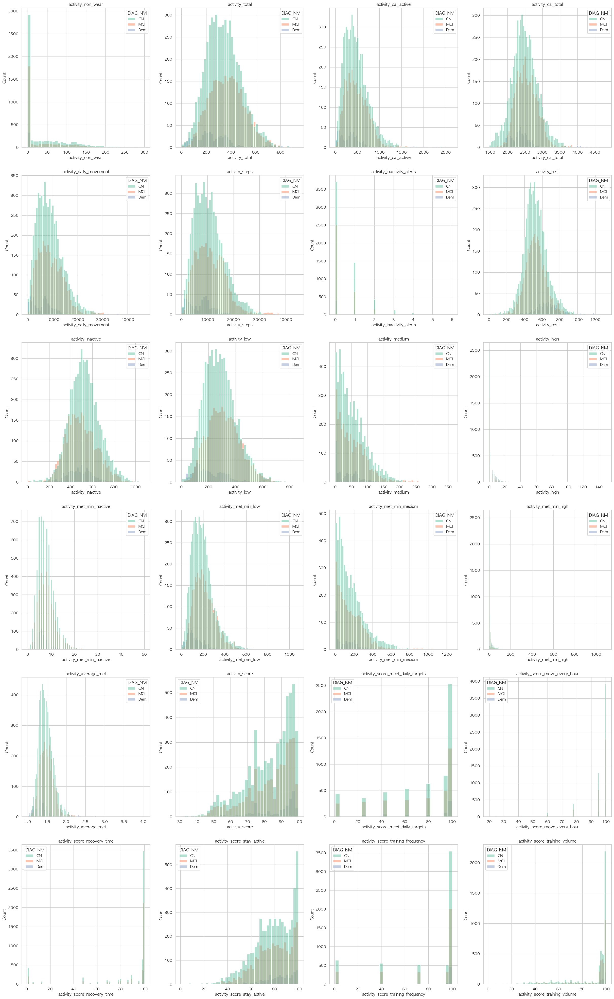

In [23]:
class_order = ['CN', 'MCI', 'Dem']
int_act = train_activity.select_dtypes(include=["int", "float"])

plt.figure(figsize=(30, 50))
for idx, col in enumerate(list(int_act)):
    plt.subplot(6, 4, idx+1)
    sns.histplot(x=col, data=train_activity, hue='DIAG_NM', hue_order=class_order)
    # plt.xticks(class_order)
    plt.title("{}".format(col))
plt.show()

In [24]:
folder="data/processed"
train_activity.to_csv(folder+"/train_activity1.csv", index=False)

In [25]:
train_activity

,EMAIL,activity_date,activity_non_wear,activity_total,activity_cal_active,activity_cal_total,activity_daily_movement,activity_steps,activity_inactivity_alerts,activity_rest,...,activity_met_min_high,activity_average_met,activity_score,activity_score_meet_daily_targets,activity_score_move_every_hour,activity_score_recovery_time,activity_score_stay_active,activity_score_training_frequency,activity_score_training_volume,DIAG_NM
0,nia+279@rowan.kr,2020-10-19,0,207,196,2251,3353,4212,0,519,...,0,1.28125,82.0,60.0,78.0,100.0,68.0,96.0,96.0,MCI
1,nia+279@rowan.kr,2020-10-20,117,140,145,2159,2516,3306,0,464,...,0,1.25000,75.0,43.0,95.0,100.0,60.0,71.0,95.0,MCI
2,nia+279@rowan.kr,2020-10-21,0,131,118,2140,1716,2550,1,601,...,0,1.21875,49.0,1.0,78.0,100.0,62.0,1.0,45.0,MCI
3,nia+279@rowan.kr,2020-10-22,85,208,180,2240,2791,4009,0,442,...,0,1.28125,47.0,1.0,100.0,100.0,52.0,1.0,30.0,MCI
4,nia+279@rowan.kr,2020-10-23,33,517,374,2559,5393,8081,0,453,...,0,1.46875,46.0,1.0,78.0,100.0,46.0,1.0,42.0,MCI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9700,nia+206@rowan.kr,2020-12-24,0,190,249,2351,4411,4972,4,470,...,7,1.34375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN
9701,nia+206@rowan.kr,2020-12-26,0,394,570,2682,11057,11878,1,528,...,7,1.53125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN
9702,nia+206@rowan.kr,2020-12-27,0,207,295,2331,5135,5752,0,655,...,28,1.34375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN
9703,nia+206@rowan.kr,2020-12-28,113,156,186,2280,3178,3852,1,393,...,0,1.31250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN


## Activity log

### met_log

- train_activity 이상치 데이터 똑같이 제거

In [29]:
train_metlog_merged = train_metlog.merge(train_activity[['EMAIL', 'activity_date']], how='inner', on=['EMAIL', 'activity_date'])
train_metlog_merged.shape[0]/1440

9690.0

In [30]:
train_metlog_merged.met.isna().sum()

np.int64(0)

- met < 1 값 별로 차지하는 비율 확인.
    - 0.9의 비율이 가장 많이 차지하고 있음. -> 수면 등 휴식 상태

In [31]:
gr_metP=(train_metlog_merged.groupby(['EMAIL', 'activity_date', 'met'])['EMAIL'].count()/1440*100).reset_index(name='metP')

In [32]:
gr_metP_75P = gr_metP[(gr_metP['met']<1)&(gr_metP['metP']>75)].sort_values('metP', ascending=False)
print('met < 1 인 MET별 하루중 75% 이상 차지하는 MET: ', gr_metP_75P['met'].unique())
print('met < 1 인 MET별 하루중 75% 이상 차지하는 MET 갯수: ', gr_metP_75P.shape[0])
gr_metP_75P.head(15)

met < 1 인 MET별 하루중 75% 이상 차지하는 MET:  [0.9]
met < 1 인 MET별 하루중 75% 이상 차지하는 MET 갯수:  47


,EMAIL,activity_date,met,metP
202633,nia+196@rowan.kr,2021-01-05,0.9,96.388889
48600,nia+044@rowan.kr,2021-01-04,0.9,96.180556
366762,nia+354@rowan.kr,2020-12-31,0.9,95.902778
450085,nia+456@rowan.kr,2021-02-05,0.9,95.555556
163401,nia+155@rowan.kr,2021-01-04,0.9,95.000000
332878,nia+336@rowan.kr,2020-12-29,0.9,94.652778
98109,nia+092@rowan.kr,2020-12-30,0.9,94.305556
81915,nia+078@rowan.kr,2020-11-04,0.9,92.222222
90038,nia+079@rowan.kr,2021-01-06,0.9,90.625000
329965,nia+334@rowan.kr,2020-12-23,0.9,89.305556


#### met < 1 값 보정

- `met_1min` 값이 1미만 (0.9, 0.1, 0)인 경우 보정
    1. 0 (미착용 상태) → 80% 이상이면 해당 데이터 삭제 → 나머지는 1로 보정
    2. 0.1 또는 0.9 → 1로 보정

In [33]:
train_metlog[train_metlog.met < 1.].met.unique()

array([0.9, 0.1, 0. ])

In [34]:
include_zero_met = train_metlog[train_metlog.met == 0.].groupby(['EMAIL', 'activity_date'])['met'].unique().reset_index()[['EMAIL', 'activity_date']]
print(len(include_zero_met))

17


In [35]:
include_zero_met = train_metlog[train_metlog.met == 0.].groupby(['EMAIL', 'activity_date'])['met'].unique().reset_index()[['EMAIL', 'activity_date']]
include_zero_met = train_metlog.merge(include_zero_met[['EMAIL', 'activity_date']], how='inner', on=['EMAIL', 'activity_date'])
include_zero_met.shape[0]/1440
# MET 0 포함 데이터 17개

17.0

In [44]:
train_metlog['met_interpolated'] = train_metlog['met']

# EMAIL, activity_date 별 0의 비율 계산
zero_ratio = train_metlog.groupby(["EMAIL", "activity_date"])["met_interpolated"].apply(lambda x: (x == 0).mean())

# 0이 80% 이상 포함된 그룹 제거
remove_idx = zero_ratio[zero_ratio >= 0.8].index 
train_metlog = train_metlog[~train_metlog.set_index(["EMAIL", "activity_date"]).index.isin(remove_idx)]  # 삭제

# 0.9 -> 1
train_metlog["met_interpolated"] = train_metlog["met_interpolated"].replace(0.9, 1)

# 값들 사이에 있는 met < 0.9 -> 선형 보간
train_metlog.loc[train_metlog['met_interpolated'] < 0.9, 'met_interpolated'] = np.nan
train_metlog = train_metlog.groupby(["EMAIL", "activity_date"]).apply(lambda x: x.interpolate(method="linear", limit_direction="both", limit_area='inside', axis=0)).reset_index(drop=True)

# 나머지 값 -> 1로 변환
train_metlog.loc[train_metlog['met_interpolated'].isna(), 'met_interpolated']=1.


In [45]:
print("제거된 데이터: ", remove_idx)

제거된 데이터:  MultiIndex([], names=['EMAIL', 'activity_date'])


#### 보정결과

In [46]:
merged_zero_met = include_zero_met.merge(train_metlog[['EMAIL','activity_date','met_interpolated','minutes_time']], how='left', on=['EMAIL','activity_date', 'minutes_time'])

In [47]:
zero_met_email = list(merged_zero_met.EMAIL.unique())

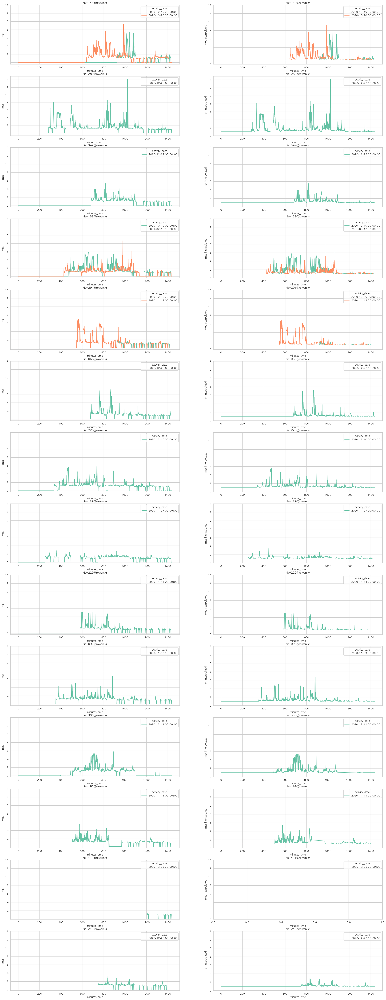

In [48]:
plt.figure(figsize=(30, 80))
for idx, email in enumerate(zero_met_email):
    plt.subplot(14, 2, idx*2+1)
    sns.lineplot(data=merged_zero_met[merged_zero_met['EMAIL']==email], x='minutes_time', y='met', hue='activity_date')
    plt.yticks(np.arange(0, 15.5, 2))
    plt.title(email)
    
    plt.subplot(14, 2, idx*2+2)
    sns.lineplot(data=merged_zero_met[merged_zero_met['EMAIL']==email], x='minutes_time', y='met_interpolated', hue='activity_date')
    plt.yticks(np.arange(0, 15.5, 2))
    plt.title(email)
plt.show()

- 처리방법: 선형보간
    - MET 값은 1 이상이 정상인데, 1보다 작은 값이 있으면 데이터 오류 또는 센서 민감도 문제일 가능성이 있음. 
- 시간대별 보간 방식 차등 적용
    - 낮(활동 시간대, 예: 6AM~10PM) → 선형 보간 (linear)
    - 밤(비활동 시간대, 예: 10PM~6AM) → fillna(0) 또는 ffill()


#### 시간대 나누기

| 시간대  | 실제 시간 (시:분) | `minutes_time` 범위 |
|---------|-----------------|--------------------|
| **morning** | 04:00 ~ 09:59  | **0 ~ 359**  |
| **daytime** | 10:00 ~ 17:59  | **360 ~ 719**  |
| **evening** | 18:00 ~ 23:59  | **720 ~ 1079**  |
| **night** | 22:00 ~ 03:59  | **1080 ~ 1439** |

In [49]:
# 시간대 매핑 함수 정의
def get_time_period(minutes):
    if 0 <= minutes <= 359:
        return "morning"
    elif 360 <= minutes <= 719:
        return "daytime"
    elif 720 <= minutes <= 1079:
        return "evening"
    else:
        return "night"

# train_metlog 데이터프레임에 'time_period' 컬럼 추가
train_metlog["time_period"] = train_metlog["minutes_time"].apply(get_time_period)

train_metlog.head()


,EMAIL,activity_date,minutes_time,met,DIAG_NM,met_interpolated,time_period
0,nia+003@rowan.kr,2020-10-18,0,1.2,MCI,1.2,morning
1,nia+003@rowan.kr,2020-10-18,1,0.9,MCI,1.0,morning
2,nia+003@rowan.kr,2020-10-18,2,0.9,MCI,1.0,morning
3,nia+003@rowan.kr,2020-10-18,3,0.9,MCI,1.0,morning
4,nia+003@rowan.kr,2020-10-18,4,0.9,MCI,1.0,morning


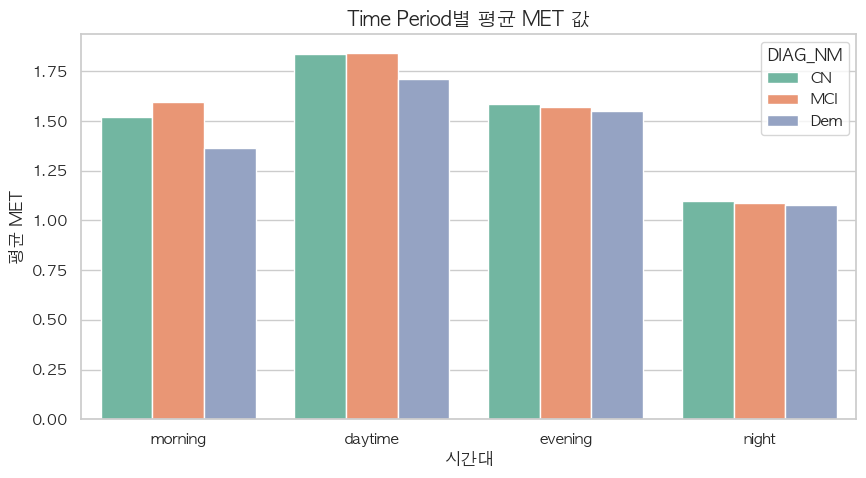

In [50]:
class_order=['CN','MCI','Dem']
# 1. time_period별 met 평균값 비교
plt.figure(figsize=(10, 5))
sns.barplot(x="time_period", y="met_interpolated", data=train_metlog, estimator=lambda x: x.mean(), ci=None, hue='DIAG_NM', hue_order=class_order)
plt.title("Time Period별 평균 MET 값", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("평균 MET")
plt.show()

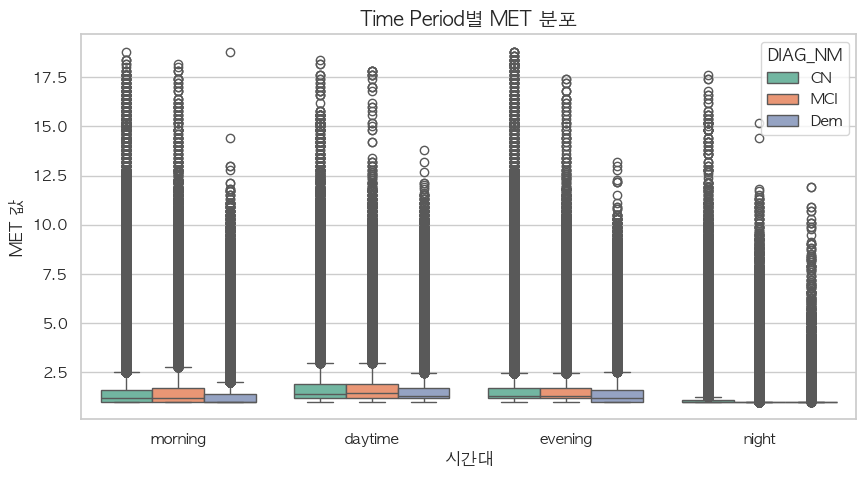

In [51]:
# 2. time_period별 met 분포 확인
plt.figure(figsize=(10, 5))
sns.boxplot(x="time_period", y="met_interpolated", data=train_metlog, hue='DIAG_NM', hue_order=class_order)
plt.title("Time Period별 MET 분포", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("MET 값")
plt.show()

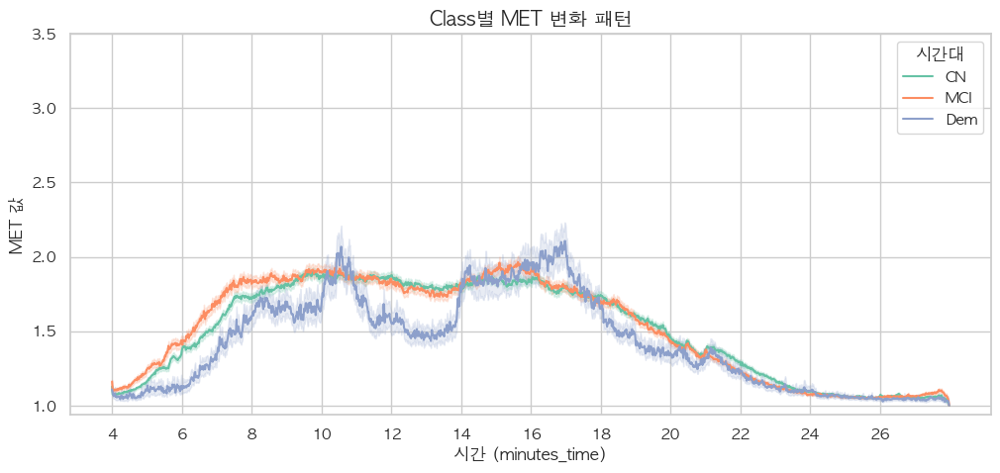

In [52]:
# 3. 시간대별 시계열 변화 패턴 (평균값 기준)
plt.figure(figsize=(12, 5))
sns.lineplot(x="minutes_time", y="met_interpolated", data=train_metlog, estimator=lambda x: x.mean(), hue='DIAG_NM', hue_order=class_order)
plt.title("Class별 MET 변화 패턴", fontsize=14)
plt.xticks(np.arange(0, 1440, 120), labels=np.arange(4, 28, 2))
plt.yticks(np.arange(1,4,0.5))
plt.xlabel("시간 (minutes_time)")
plt.ylabel("MET 값")
plt.legend(title="시간대")
plt.show()

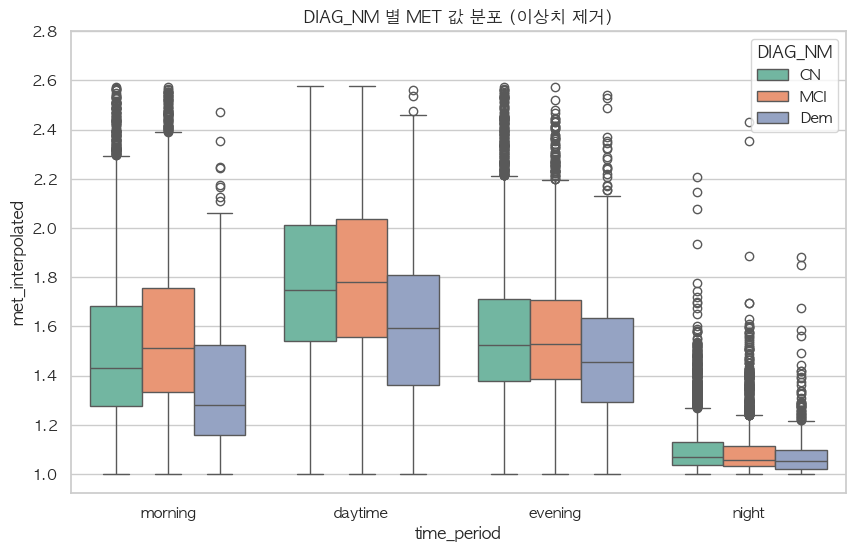

In [53]:
# IQR 기반 이상치 제거 함수
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

met_avg = train_metlog.groupby(['EMAIL', 'activity_date', 'time_period']).agg({'met_interpolated':'mean',
                                                                               'DIAG_NM':'first'}).reset_index()
filtered_df = remove_outliers(met_avg, "met_interpolated")

# Boxplot 그리기 (DIAG_NM 별 분포)
plt.figure(figsize=(10, 6))
sns.boxplot(x="time_period", y="met_interpolated", data=filtered_df, hue='DIAG_NM', hue_order=class_order, order=['morning','daytime','evening','night'])
plt.title("DIAG_NM 별 MET 값 분포 (이상치 제거)")
plt.yticks(np.arange(1,3,0.2))
plt.show()

In [54]:
log_folder="data/processed/log"
train_metlog.to_csv(log_folder+"/train_metlog1.csv", index=False)

### 활동 유형 분류하기

#### 방법1: 아침형/저녁형으로 분류
1) 평균 활동량을 일정 시간대 별로 계산한다.
2) 아침(4:00~17:59), 저녁(18:00~03:59) 어느 시간대에 활동량이 많은지 count한다.
    - morning: 아침에 주로 활동하는 사람
    - evening: 저녁에 주로 활동하는 사람

In [64]:
log_folder="data/processed/log"
train_metlog = pd.read_csv(log_folder+"/train_metlog1.csv", parse_dates=['activity_date'])

In [65]:
train_metlog.head()

,EMAIL,activity_date,minutes_time,met,DIAG_NM,met_interpolated,time_period
0,nia+003@rowan.kr,2020-10-18,0,1.2,MCI,1.2,morning
1,nia+003@rowan.kr,2020-10-18,1,0.9,MCI,1.0,morning
2,nia+003@rowan.kr,2020-10-18,2,0.9,MCI,1.0,morning
3,nia+003@rowan.kr,2020-10-18,3,0.9,MCI,1.0,morning
4,nia+003@rowan.kr,2020-10-18,4,0.9,MCI,1.0,morning


In [66]:
# 사람별 minutes_time을 0~1439 범위로 변환 (하루 단위)
def classify_chronotype(df):
    # 각 사람별 시간대별 활동량 합산
    activity_summary = df.groupby(["EMAIL", "activity_date", "time_period"])["met_interpolated"].sum().unstack(fill_value=0)

    # 아침형/올빼미형 분류
    def classify(row):
        morning_activity = row.get("morning", 0) + row.get("daytime", 0)
        night_activity = row.get("evening", 0) + row.get("night", 0)

        if morning_activity > night_activity:
            return "morning"  # 아침형
        else:
            return "evening"  # 저녁형

    activity_summary["chrono_2type"] = activity_summary.apply(classify, axis=1)

    return activity_summary.reset_index()

In [67]:
# 아침형 vs 올빼미형 인간 분류 실행
result = classify_chronotype(train_metlog)
result_gr = result.groupby(['EMAIL'])['chrono_2type'].value_counts().unstack(level=1).reset_index()
result_gr = result_gr.fillna(0)

# 저녁 대비 아침 활동률 계산 1보다 크면 morning, 작으면 evening -> 해당 변수의 분포 확인
result_gr['mornig_evening_ratio'] = result_gr['morning'] / result_gr['evening']
result_gr['chrono_2type'] = np.where(result_gr['mornig_evening_ratio'] > 1, 'morning', 'evening')
result_gr.chrono_2type.value_counts()

chrono_2type
morning    138
evening      3
Name: count, dtype: int64

In [68]:
result_gr.tail()

chrono_2type,EMAIL,evening,morning,mornig_evening_ratio,chrono_2type
136,nia+451@rowan.kr,0.0,38.0,inf,morning
137,nia+456@rowan.kr,3.0,61.0,20.333333,morning
138,nia+458@rowan.kr,3.0,48.0,16.000000,morning
139,nia+462@rowan.kr,0.0,41.0,inf,morning
140,nia+475@rowan.kr,13.0,33.0,2.538462,morning


In [121]:
train_label_merged = train_label.merge(result_gr, how='inner', on='EMAIL')
train_label_merged.loc[train_label_merged['mornig_evening_ratio']==np.inf, 'mornig_evening_ratio'] = train_label_merged['morning']
train_label_merged.head()

,EMAIL,DIAG_NM,evening,morning,mornig_evening_ratio,chrono_2type
0,nia+315@rowan.kr,CN,1.0,56.0,56.000000,morning
1,nia+014@rowan.kr,MCI,6.0,62.0,10.333333,morning
2,nia+220@rowan.kr,CN,1.0,70.0,70.000000,morning
3,nia+096@rowan.kr,MCI,1.0,47.0,47.000000,morning
4,nia+396@rowan.kr,CN,5.0,33.0,6.600000,morning


<Axes: xlabel='chrono_2type', ylabel='count'>

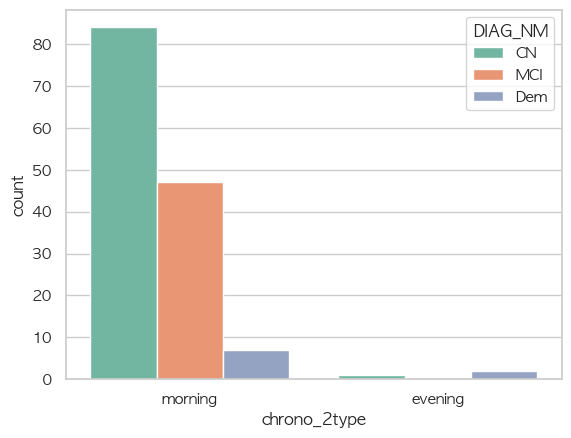

In [70]:
sns.countplot(x='chrono_2type', data=train_label_merged, hue='DIAG_NM')

#### 방법2: 아침형/중간형/저녁형으로 분류
- 아침/저녁 시간대 활동 비율이 60% 이상이면 그 유형으로 분류, 아니면 뉴트럴
    - 계산방법: 하루간 각 시간대의 MET 합을, 전체 MET의 합 `total_met`으로 나눈다. 
    - 하루중 시간대 별 met 비중을 알 수 있음, 04:00~17:59 사이의 활동이 하루의 60% 이상을 차지하고 있다면 아침형 인간,   
     18:00~03:59 사이의 활동이 60% 이상을 차지하고 있다면 저녁형 인간, 둘 다 아니라면 중간형으로 구분한다.

In [71]:
# 사람별 시간대별 평균 MET
activity_pattern = train_metlog.groupby(["EMAIL", "time_period"])["met_interpolated"].mean().unstack()

# 각 사람별 최대 활동 시간대 찾기
activity_pattern["max_activity_time"] = activity_pattern.idxmax(axis=1)
activity_pattern['max_activity_time'].value_counts()

max_activity_time
daytime    121
morning     14
evening      6
Name: count, dtype: int64

In [72]:
activity_pattern

time_period,daytime,evening,morning,night,max_activity_time
EMAIL,,,,,
nia+003@rowan.kr,1.409679,1.346993,1.329408,1.112597,daytime
nia+005@rowan.kr,1.616631,1.578066,1.338906,1.101927,daytime
nia+010@rowan.kr,1.566609,1.586327,1.449239,1.077560,evening
nia+014@rowan.kr,1.772682,1.560006,1.433597,1.146087,daytime
nia+015@rowan.kr,1.723934,1.548246,1.422633,1.063357,daytime
...,...,...,...,...,...
nia+451@rowan.kr,1.623293,1.328542,2.502090,1.033940,morning
nia+456@rowan.kr,1.974542,1.646081,1.543281,1.133950,daytime
nia+458@rowan.kr,1.515961,1.368607,1.282151,1.057197,daytime


In [73]:
# 사람별 시간대별 평균 MET
activity_pattern = train_metlog.groupby(["EMAIL", "activity_date", "time_period"])["met_interpolated"].mean().unstack()

# 특정 시간대 비율이 60% 이상이면 그 유형으로 분류
activity_pattern["total_met"] = activity_pattern.sum(axis=1)
activity_pattern["morning_ratio"] = (activity_pattern["morning"]+activity_pattern["daytime"])/ activity_pattern["total_met"]
activity_pattern["evening_ratio"] = (activity_pattern["evening"]+activity_pattern["night"]) / activity_pattern["total_met"]

activity_pattern["activity_type"] = "intermediate"
activity_pattern.loc[activity_pattern["morning_ratio"] > 0.55, "activity_type"] = "morning"
activity_pattern.loc[activity_pattern["evening_ratio"] > 0.55, "activity_type"] = "evening"

# print(activity_pattern[["max_activity_time", "activity_type"]])

In [122]:
activity_pattern = activity_pattern.reset_index()
train_activity = train_activity.merge(activity_pattern, how='inner', on=['EMAIL','activity_date'])
pattern_gr = activity_pattern.groupby(['EMAIL', 'activity_type'])['EMAIL'].count().unstack().idxmax(axis=1).reset_index(name='chrono_3type')
train_label_merged = train_label_merged.merge(pattern_gr, how='inner', on='EMAIL')
train_label_merged.head()

,EMAIL,DIAG_NM,evening,morning,mornig_evening_ratio,chrono_2type,chrono_3type
0,nia+315@rowan.kr,CN,1.0,56.0,56.000000,morning,morning
1,nia+014@rowan.kr,MCI,6.0,62.0,10.333333,morning,intermediate
2,nia+220@rowan.kr,CN,1.0,70.0,70.000000,morning,morning
3,nia+096@rowan.kr,MCI,1.0,47.0,47.000000,morning,intermediate
4,nia+396@rowan.kr,CN,5.0,33.0,6.600000,morning,intermediate


<Axes: xlabel='chrono_3type', ylabel='count'>

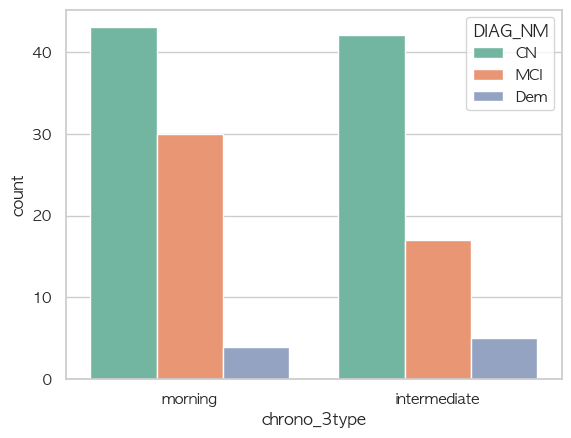

In [79]:
sns.countplot(x='chrono_3type', data=train_label_merged, hue='DIAG_NM')

#### 방법3: 기상시간에 따른 분류
- sleep date 의 경우 activity start 날짜의 당일 수면 기록이다. 
- 기상시간이 빠르면 아침 활동이 많을 확률이 높음

In [55]:
train_sleep = sleep.merge(train_label, how="inner", on="EMAIL")
train_sleep.head()

,EMAIL,sleep_bedtime_start,sleep_bedtime_end,sleep_period_id,sleep_duration,sleep_total,sleep_awake,sleep_rem,sleep_light,sleep_deep,...,sleep_score_alignment,sleep_score_deep,sleep_score_disturbances,sleep_score_efficiency,sleep_score_latency,sleep_score_rem,sleep_score_total,sleep_temperature_delta,sleep_temperature_deviation,DIAG_NM
0,nia+279@rowan.kr,2020-10-18 18:38:28,2020-10-19 05:10:28,0,37920,29220,8700,3780,15330,10110,...,87,100,78,65,89,56,94,0.00,0.00,MCI
1,nia+279@rowan.kr,2020-10-19 21:39:52,2020-10-20 05:37:52,1,28680,22110,6570,2850,11820,7440,...,100,98,77,65,97,43,65,0.34,0.34,MCI
2,nia+279@rowan.kr,2020-10-20 20:51:28,2020-10-21 05:45:28,0,32040,21510,10530,4530,12360,4620,...,100,94,60,41,75,68,62,-0.07,-0.07,MCI
3,nia+279@rowan.kr,2020-10-21 22:08:16,2020-10-22 05:12:16,3,25440,21360,4080,4860,9060,7440,...,100,98,80,81,83,73,62,-0.14,-0.14,MCI
4,nia+279@rowan.kr,2020-10-22 20:38:30,2020-10-23 02:23:30,0,20700,13530,7170,1740,7470,4320,...,80,88,72,39,78,25,29,-0.50,-0.50,MCI


In [57]:
def classify_chronotype(wake_time):
    """
    기상 시간을 기준으로 chronotype을 분류합니다.
    """
    if wake_time.hour < 6: # 06:00 이전
        return "morning"
    elif 6 <= wake_time.hour < 9: # 06:00~08:59
        return "intermediate"
    else: # 09:00 이후
        return "evening"

def calculate_wakeup_time(row):
    """
    개인의 chronotype과 실제 기상 시간의 차이를 계산하여 기상시간 점수를 생성합니다.
    """
    ideal_wake_times = {
        "morning": 6 * 60,  # 05:00 (300분)
        "intermediate": 7 * 60,  # 07:00 (420분)
        "evening": 9 * 60  # 09:00 (540분)
    }
    actual_wake_time = row["sleep_bedtime_end"].hour * 60 + row["sleep_bedtime_end"].minute
    ideal_wake_time = ideal_wake_times[row["chronotype"]]
    return abs(actual_wake_time - ideal_wake_time)


In [58]:
# chronotype 생성
train_sleep["chronotype"] = train_sleep["sleep_bedtime_end"].apply(classify_chronotype)

# 기상시간이 일정한지. 계산
train_sleep["wakeup_time_diff"] = train_sleep.apply(calculate_wakeup_time, axis=1)
train_sleep[["EMAIL", "sleep_bedtime_end", "chronotype", "wakeup_time_diff"]].head()

,EMAIL,sleep_bedtime_end,chronotype,wakeup_time_diff
0,nia+279@rowan.kr,2020-10-19 05:10:28,morning,50
1,nia+279@rowan.kr,2020-10-20 05:37:52,morning,23
2,nia+279@rowan.kr,2020-10-21 05:45:28,morning,15
3,nia+279@rowan.kr,2020-10-22 05:12:16,morning,48
4,nia+279@rowan.kr,2020-10-23 02:23:30,morning,217


In [59]:
train_sleep[["EMAIL", "sleep_bedtime_end", "chronotype", "wakeup_time_diff"]].describe()

,sleep_bedtime_end,wakeup_time_diff
count,9705,9705.000000
mean,2020-12-05 20:28:33.691087104,55.969191
min,2020-10-17 00:17:29,0.000000
25%,2020-11-13 03:10:56,19.000000
50%,2020-12-04 07:34:10,41.000000
75%,2020-12-24 05:38:59,69.000000
max,2021-02-17 08:43:01,895.000000
std,NaN,61.865879


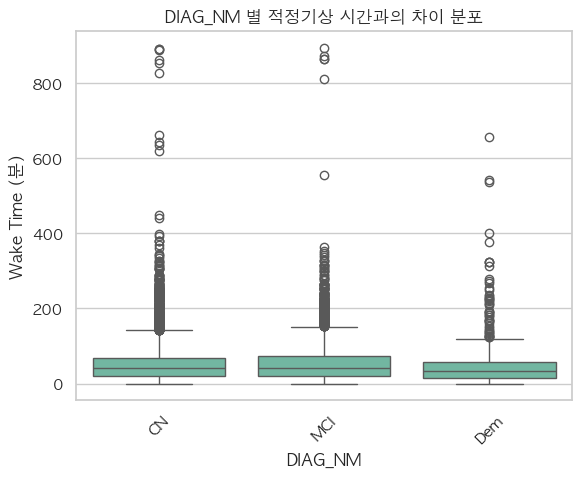

In [60]:
sns.boxplot(y='wakeup_time_diff', data=train_sleep, x='DIAG_NM', order=class_order)

plt.title("DIAG_NM 별 적정기상 시간과의 차이 분포")
plt.ylabel("Wake Time (분)")
plt.xlabel("DIAG_NM")
plt.xticks(rotation=45)
plt.show()

In [61]:
# chronotype별 적정 수면 시간 (예시, 연구 자료 참고 가능)
CHRONOTYPE_SLEEP_GOAL = {
    "morning": 7 * 60 * 60,  # 7시간
    "intermediate": 7.5 * 60 * 60,  # 7시간 30분
    "evening": 8 * 60 * 60  # 8시간
}

# sleep_alignment 계산 (실제 수면 시간과 chronotype별 적정 수면 시간 차이)
train_sleep["sleep_alignment_chronotype"] = train_sleep.apply(
    lambda x: x["sleep_total"] - CHRONOTYPE_SLEEP_GOAL[x["chronotype"]], axis=1
)

# sleep_alignment 단위 변환 (초 -> 분 단위로 변환 가능)
train_sleep["sleep_alignment_chronotype_mins"] = train_sleep["sleep_alignment_chronotype"] / 60
train_sleep[["EMAIL", "chronotype", "sleep_total", "sleep_alignment_chronotype", "sleep_alignment_chronotype_mins"]].head()


,EMAIL,chronotype,sleep_total,sleep_alignment_chronotype,sleep_alignment_chronotype_mins
0,nia+279@rowan.kr,morning,29220,4020.0,67.0
1,nia+279@rowan.kr,morning,22110,-3090.0,-51.5
2,nia+279@rowan.kr,morning,21510,-3690.0,-61.5
3,nia+279@rowan.kr,morning,21360,-3840.0,-64.0
4,nia+279@rowan.kr,morning,13530,-11670.0,-194.5


In [63]:
train_sleep[["EMAIL", "chronotype", "sleep_total", "sleep_alignment_chronotype", "sleep_alignment_chronotype_mins"]].describe()

,sleep_total,sleep_alignment_chronotype,sleep_alignment_chronotype_mins
count,9705.000000,9705.000000,9705.000000
mean,23617.316847,-2677.891808,-44.631530
std,5477.022114,5200.298172,86.671636
min,5910.000000,-19290.000000,-321.500000
25%,19890.000000,-6150.000000,-102.500000
50%,23760.000000,-2520.000000,-42.000000
75%,27150.000000,720.000000,12.000000
max,47790.000000,19980.000000,333.000000


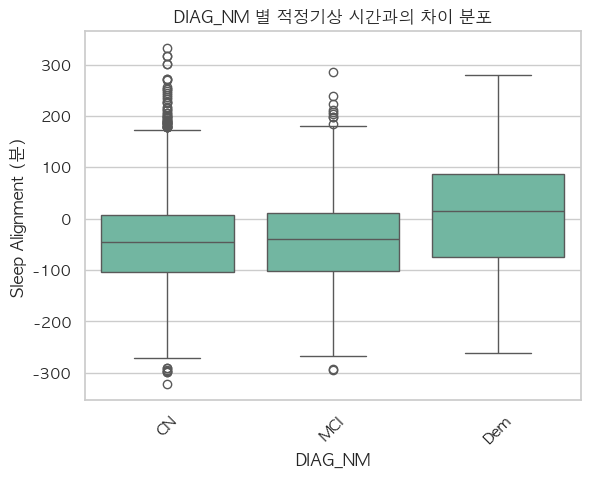

In [64]:
sns.boxplot(y='sleep_alignment_chronotype_mins', data=train_sleep, x='DIAG_NM', order=class_order)

plt.title("DIAG_NM 별 적정기상 시간과의 차이 분포")
plt.ylabel("Sleep Alignment (분)")
plt.xlabel("DIAG_NM")
plt.xticks(rotation=45)
plt.show()

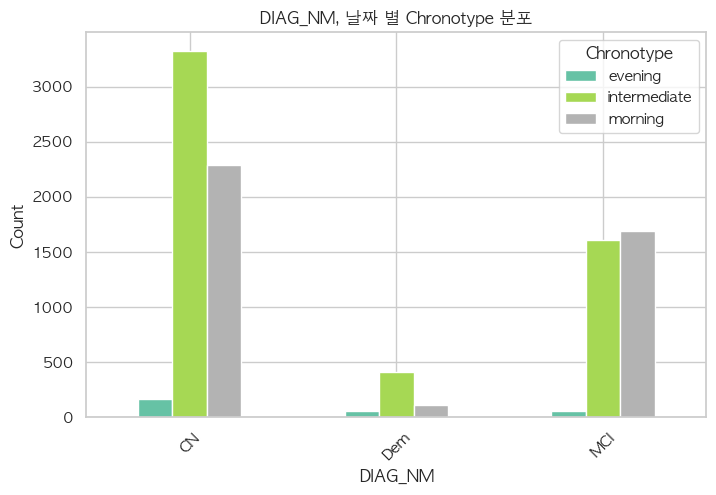

In [65]:
type_order=['morning','intermediate','evening']
# 시각화
train_sleep.groupby('DIAG_NM')['chronotype'].value_counts().unstack().plot(kind="bar", colormap="Set2", figsize=(8, 5), legend=type_order)

plt.title("DIAG_NM, 날짜 별 Chronotype 분포")
plt.ylabel("Count")
plt.xlabel("DIAG_NM")
plt.legend(title="Chronotype")
plt.xticks(rotation=45)
plt.show()

In [66]:
train_sleep_gr = train_sleep.groupby(['EMAIL', 'chronotype'])['EMAIL'].count().unstack().idxmax(axis=1).reset_index(name='chronotype')
train_sleep_gr['chronotype'].value_counts()

chronotype
intermediate    78
morning         61
evening          2
Name: count, dtype: int64

In [124]:
train_sleep_gr.rename(columns={'chronotype':'chronotype_sleep'},inplace=True)
train_label_merged = train_label_merged.merge(train_sleep_gr, how='inner', on='EMAIL')
train_label_merged

,EMAIL,DIAG_NM,evening,morning,mornig_evening_ratio,chrono_2type,chrono_3type,chronotype_sleep
0,nia+315@rowan.kr,CN,1.0,56.0,56.000000,morning,morning,morning
1,nia+014@rowan.kr,MCI,6.0,62.0,10.333333,morning,intermediate,intermediate
2,nia+220@rowan.kr,CN,1.0,70.0,70.000000,morning,morning,intermediate
3,nia+096@rowan.kr,MCI,1.0,47.0,47.000000,morning,intermediate,intermediate
4,nia+396@rowan.kr,CN,5.0,33.0,6.600000,morning,intermediate,intermediate
...,...,...,...,...,...,...,...,...
136,nia+181@rowan.kr,CN,15.0,47.0,3.133333,morning,intermediate,morning
137,nia+354@rowan.kr,CN,0.0,57.0,57.000000,morning,intermediate,intermediate
138,nia+448@rowan.kr,MCI,4.0,33.0,8.250000,morning,intermediate,intermediate
139,nia+394@rowan.kr,CN,0.0,36.0,36.000000,morning,morning,morning


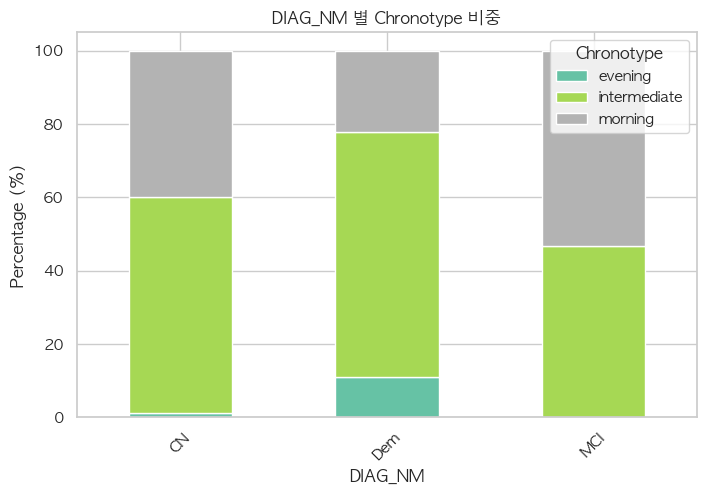

In [125]:
# DIAG_NM 별 chronotype 비율 계산
chronotype_counts = train_label_merged.groupby(["DIAG_NM", "chronotype_sleep"]).size().reset_index(name="count")

# 전체 DIAG_NM별 데이터 개수 구하기
total_counts = chronotype_counts.groupby("DIAG_NM")["count"].sum().reset_index(name="total")

# 비율 계산 (chronotype 비중)
chronotype_counts = chronotype_counts.merge(total_counts, on="DIAG_NM")
chronotype_counts["percentage"] = chronotype_counts["count"] / chronotype_counts["total"] * 100  # 비율(%)

# 데이터 pivot (Stacked Bar Chart를 위한 형태 변환)
chronotype_pivot = chronotype_counts.pivot(index="DIAG_NM", columns="chronotype_sleep", values="percentage")

# 시각화
chronotype_pivot.plot(kind="bar", stacked=True, colormap="Set2", figsize=(8, 5))

plt.title("DIAG_NM 별 Chronotype 비중")
plt.ylabel("Percentage (%)")
plt.xlabel("DIAG_NM")
plt.legend(title="Chronotype")
plt.xticks(rotation=45)
plt.show()

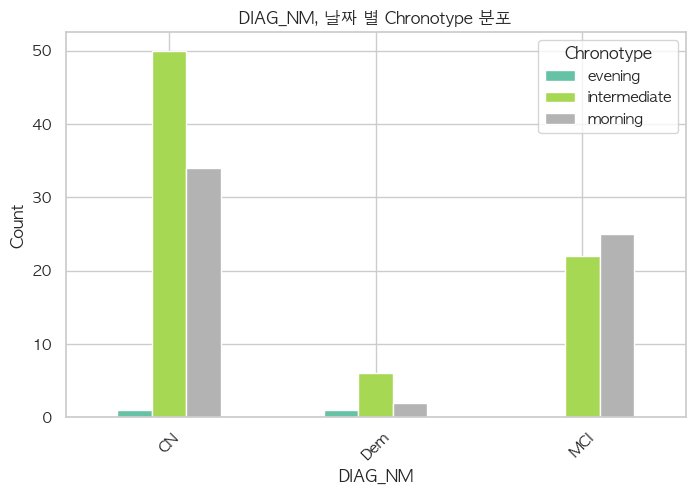

In [113]:
type_order=['morning','intermediate','evening']
# 시각화
chronotype_counts.pivot(index="DIAG_NM", columns="chronotype_sleep", values="count").plot(kind="bar", colormap="Set2", figsize=(8, 5), legend=type_order)

plt.title("DIAG_NM, 날짜 별 Chronotype 분포")
plt.ylabel("Count")
plt.xlabel("DIAG_NM")
plt.legend(title="Chronotype")
plt.xticks(rotation=45)
plt.show()

### 개인별 적정 수면 시간 

평균 기상시간 & 평균 수면시간을 기준으로, 일관성 있는 패턴인지 확인하는 방법
- 사람별 평균 기상시간과 평균 수면시간을 계산
- 현재 수면시간과 평균 수면시간의 차이(sleep_alignment)를 계산
- 기상시간이 평소보다 비정상적으로 다른 경우(abnormal_wake_time = 1로 표시)

In [68]:
# 수면 시간 계산 (시간 단위 변환)
train_sleep["sleep_duration_hours"] = train_sleep["sleep_duration"] / 60 /60

# 기상시간 및 취침시간의 시간 정보만 추출
train_sleep["wake_time"] = train_sleep["sleep_bedtime_end"].dt.time
train_sleep["bed_time"] = train_sleep["sleep_bedtime_start"].dt.time

# 사람별 평균 기상시간 & 평균 수면시간 계산
person_avg = train_sleep.groupby("EMAIL").agg(
    avg_wake_time=("sleep_bedtime_end", lambda x: x.dt.hour.mean()),  # 평균 기상시간
    avg_sleep_duration=("sleep_duration_hours", "mean"),  # 평균 수면시간
    std_wake_time=("sleep_bedtime_end", lambda x: x.dt.hour.std()),  # 기상시간 표준편차
    std_sleep_duration=("sleep_duration_hours", "std")  # 수면시간 표준편차
).reset_index()

# 원본 데이터와 병합
train_sleep = train_sleep.merge(person_avg, on="EMAIL", how="left")

# Sleep Alignment 계산 (적정 수면 시간과의 차이)
train_sleep["sleep_alignment"] = np.abs(train_sleep["sleep_duration_hours"] - train_sleep["avg_sleep_duration"])

# 비정상적인 기상 여부 (평균 기상시간과 ±1.5표준편차 이상 차이)
train_sleep["abnormal_wake_time"] = np.where(
    np.abs(train_sleep["sleep_bedtime_end"].dt.hour - train_sleep["avg_wake_time"]) > (1.5 * train_sleep["std_wake_time"]),
    1, 0
)

# 최종 데이터 확인
train_sleep[["EMAIL", "sleep_duration_hours", "avg_sleep_duration", "sleep_alignment", "abnormal_wake_time"]].head()


,EMAIL,sleep_duration_hours,avg_sleep_duration,sleep_alignment,abnormal_wake_time
0,nia+279@rowan.kr,10.533333,7.936458,2.596875,0
1,nia+279@rowan.kr,7.966667,7.936458,0.030208,0
2,nia+279@rowan.kr,8.900000,7.936458,0.963542,0
3,nia+279@rowan.kr,7.066667,7.936458,0.869792,0
4,nia+279@rowan.kr,5.750000,7.936458,2.186458,1


In [74]:
log_folder="data/processed"
# train_label_merged.to_csv(log_folder+"/train_label_merged.csv", index=False)
train_activity.to_csv(log_folder+"/train_activity_add.csv", index=False)
train_sleep.to_csv(log_folder+"/train_sleep_add.csv", index=False)

### met_class